In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
import numpy as np
from tqdm import tqdm
from pathlib import Path
import openslide
import pandas as pd

In [4]:
from fastai.callbacks.csv_logger import CSVLogger

In [5]:
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.helper.wsi_loader import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric, PascalVOCMetricByDistance

In [6]:
slides_train = list(set(['BAL Promyk Spray 4.svs',
                         'BAL AIA Blickfang Luft.svs']))

slides_val = list(set(['BAL 1 Spray 2.svs', 
                         'BAL Booker Spray 3.svs',
                         'BAL Bubi Spray 1.svs', 
                         'BAL cent blue Luft 2.svs']))

labels = ['Lymohozyten']

In [7]:
experiment_name = "Asthma-L0"

In [8]:
annotations_path = Path("../Statistics/Asthma_Annotations.pkl")
annotations = pd.read_pickle(annotations_path)

annotations = annotations[annotations["class"].isin(labels)]
annotations_train = annotations[annotations["image_name"].isin(slides_train)]
annotations_val = annotations[annotations["image_name"].isin(slides_val)]
annotations_train.head()

,id,image_id,image_name,image_set,class,vector,unique_identifier,user_id,deleted,last_editor
25039,140900,226,BAL Promyk Spray 4.svs,14,Lymohozyten,"{'x1': 13991, 'x2': 14037, 'y1': 14520, 'y2': ...",9d552252-4980-4b09-bf78-2b7c906d41ad,10,False,None
25040,140901,226,BAL Promyk Spray 4.svs,14,Lymohozyten,"{'x1': 13940, 'x2': 13990, 'y1': 14521, 'y2': ...",e401f70c-df1e-4f50-8d78-3a07ed5c3cbe,10,False,None
25041,140902,226,BAL Promyk Spray 4.svs,14,Lymohozyten,"{'x1': 14240, 'x2': 14294, 'y1': 14441, 'y2': ...",07b795f2-a483-4191-bb32-db8f7e750234,10,False,None
25042,140903,226,BAL Promyk Spray 4.svs,14,Lymohozyten,"{'x1': 14446, 'x2': 14496, 'y1': 14406, 'y2': ...",4ead2c3a-a581-435d-99c3-bab31998ffee,10,False,None
25043,140904,226,BAL Promyk Spray 4.svs,14,Lymohozyten,"{'x1': 14496, 'x2': 14546, 'y1': 14320, 'y2': ...",d149774f-cfa4-458d-9c13-1695361ef09f,10,False,None


In [9]:
annotations["width"] = [vector["x2"] - vector["x1"] for vector in annotations["vector"]]
annotations["height"] = [vector["y2"] - vector["y1"] for vector in annotations["vector"]]
annotations["scale"] = annotations["width"] / annotations["height"]

<AxesSubplot:xlabel='width', ylabel='height'>

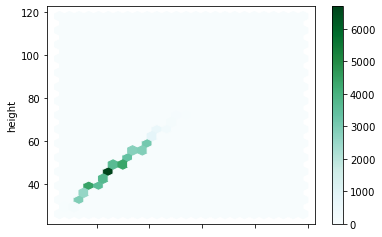

In [10]:
annotations.plot.hexbin(x='width', y='height', gridsize=25) #C='scale', 

In [11]:
slides_path = Path("../Slides")
files = {slide.name: slide for slide in slides_path.rglob("*.svs") if slide.name in slides_train + slides_val}
files

{'BAL 1 Spray 2.svs': WindowsPath('../Slides/BAL 1 Spray 2.svs'),
 'BAL AIA Blickfang Luft.svs': WindowsPath('../Slides/BAL AIA Blickfang Luft.svs'),
 'BAL Booker Spray 3.svs': WindowsPath('../Slides/BAL Booker Spray 3.svs'),
 'BAL Bubi Spray 1.svs': WindowsPath('../Slides/BAL Bubi Spray 1.svs'),
 'BAL cent blue Luft 2.svs': WindowsPath('../Slides/BAL cent blue Luft 2.svs'),
 'BAL Promyk Spray 4.svs': WindowsPath('../Slides/BAL Promyk Spray 4.svs')}

In [12]:
size = 1024 
level = 0
bs = 12
train_images = 500
val_images = 500

In [13]:
train_files = []
val_files = []

In [14]:
for image_name in annotations_train["image_name"].unique():
    
    annotations = annotations_train[annotations_train["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["class"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    for label in labels:
        if label not in set(labels):
            bboxes.append([0,0,0,0])
            labels.append(label)

    train_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
for image_name in annotations_val["image_name"].unique():
    
    annotations = annotations_val[annotations_val["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["class"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    for label in labels:
        if label not in set(labels):
            bboxes.append([0,0,0,0])
            labels.append(label)

    val_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))

train_files = list(np.random.choice(train_files, train_images))
valid_files = list(np.random.choice(val_files, val_images))

In [15]:
tfms = get_transforms(do_flip=True,
                      flip_vert=True,
                      #max_rotate=90,
                      #max_lighting=0.0,
                      #max_zoom=1.,
                      #max_warp=0.0,
                      #p_affine=0.5,
                      #p_lighting=0.0,
                      #xtra_tfms=xtra_tfms,
                     )

In [16]:
def get_y_func(x):
    return x.y

In [17]:
train =  ObjectItemListSlide(train_files, path=slides_path)
valid = ObjectItemListSlide(valid_files, path=slides_path)
item_list = ItemLists(slides_path, train, valid)
lls = item_list.label_from_func(get_y_func, label_cls=SlideObjectCategoryList) #
lls = lls.transform(tfms, tfm_y=True, size=size)
data = lls.databunch(bs=bs, collate_fn=bb_pad_collate, num_workers=0).normalize()

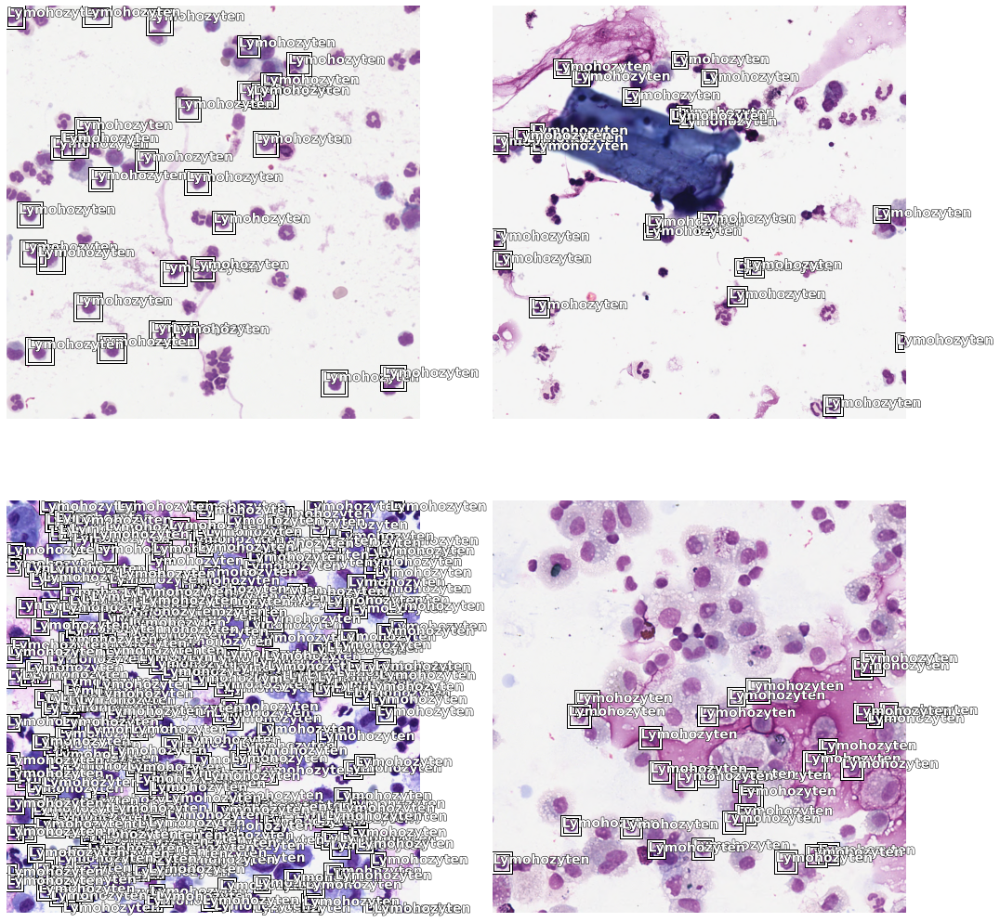

In [18]:
data.show_batch(rows=2, ds_type=DatasetType.Valid, figsize=(15,15))

In [19]:
#scales = [.1, .2, 0.3, 0.4, 0.5] # scales 32
scales = [.8, .9, 1, 1.1]
anchors = create_anchors(sizes=[(64, 64)], ratios=[1], scales=scales)

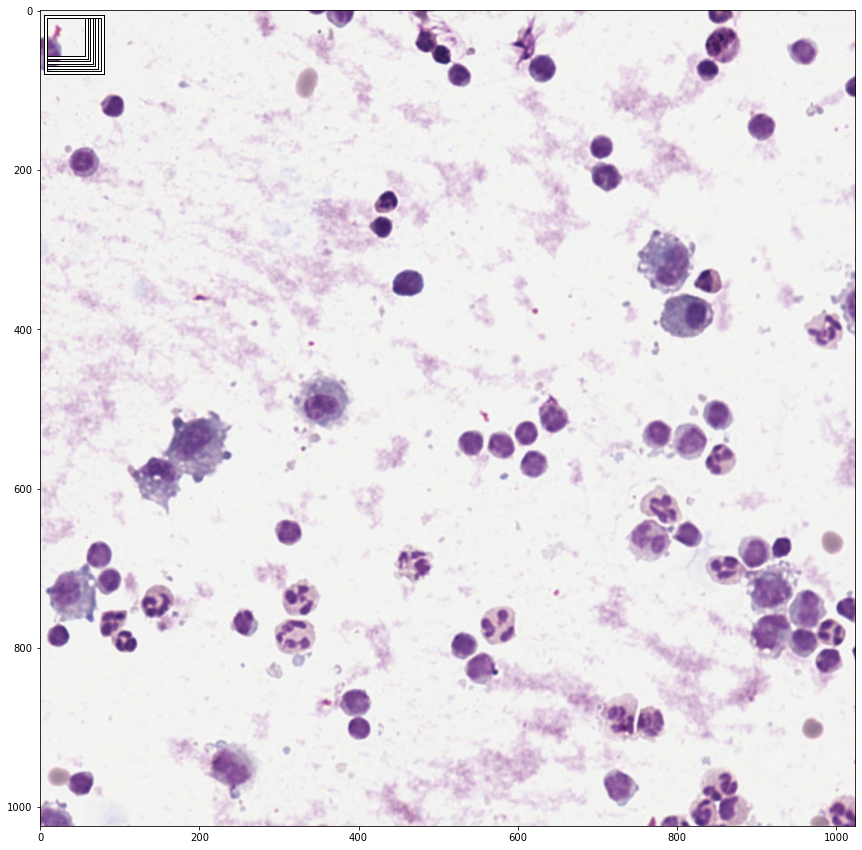

In [20]:
fig,ax = plt.subplots(figsize=(15,15))
ax.imshow(image2np(data.valid_ds[0][0].data))

for i, bbox in enumerate(anchors[:len(scales)]):
    bb = bbox.numpy()
    x = (bb[0] + 1) * size / 2 
    y = (bb[1] + 1) * size / 2 
    w = bb[2] * size / 2
    h = bb[3] * size / 2
    
    rect = [x,y,w,h]
    draw_rect(ax,rect)

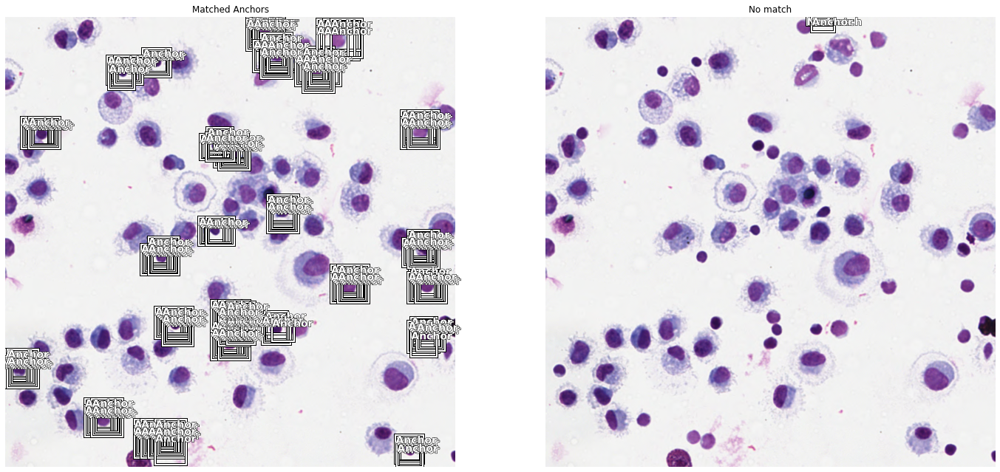

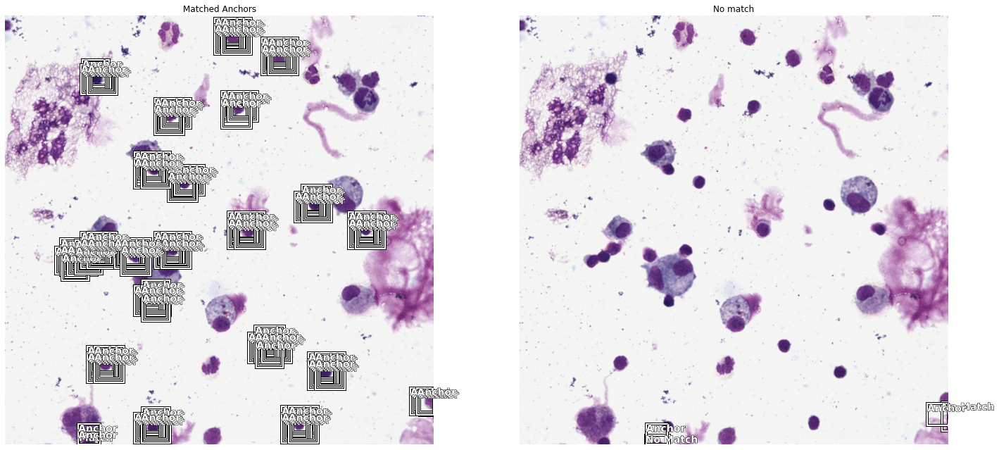

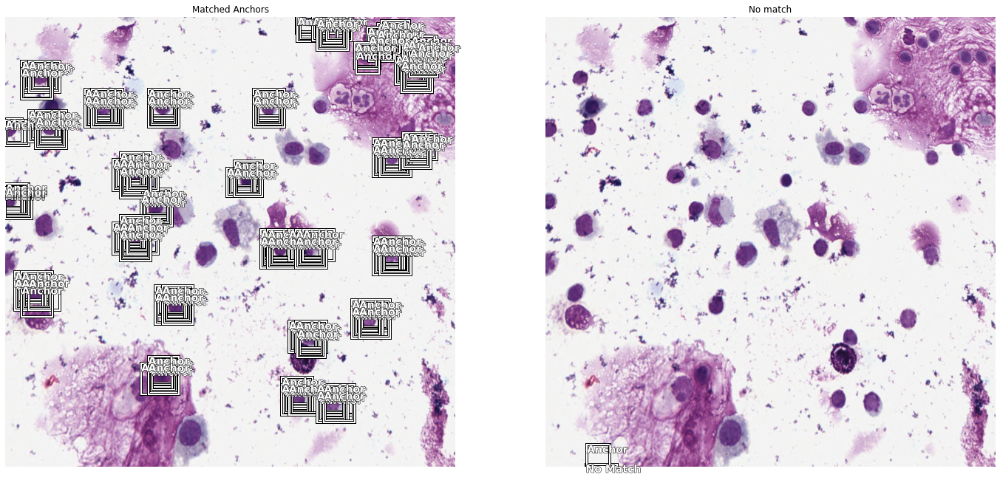

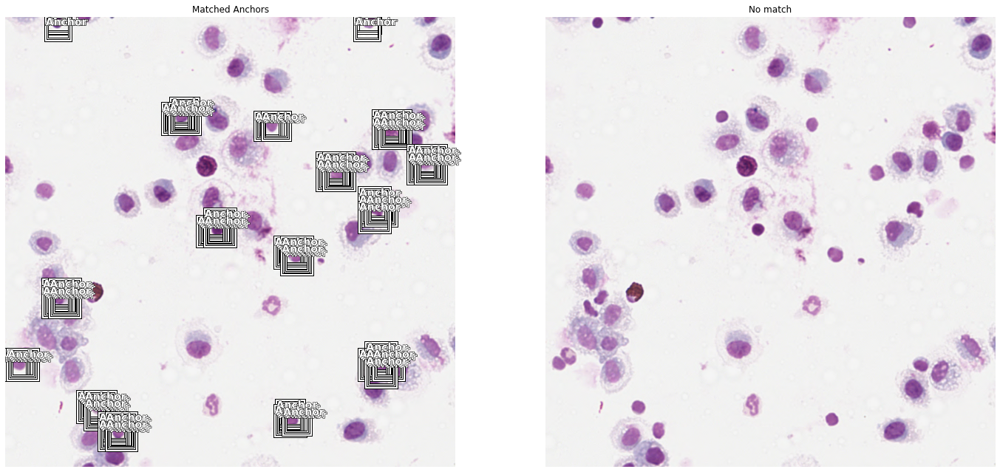

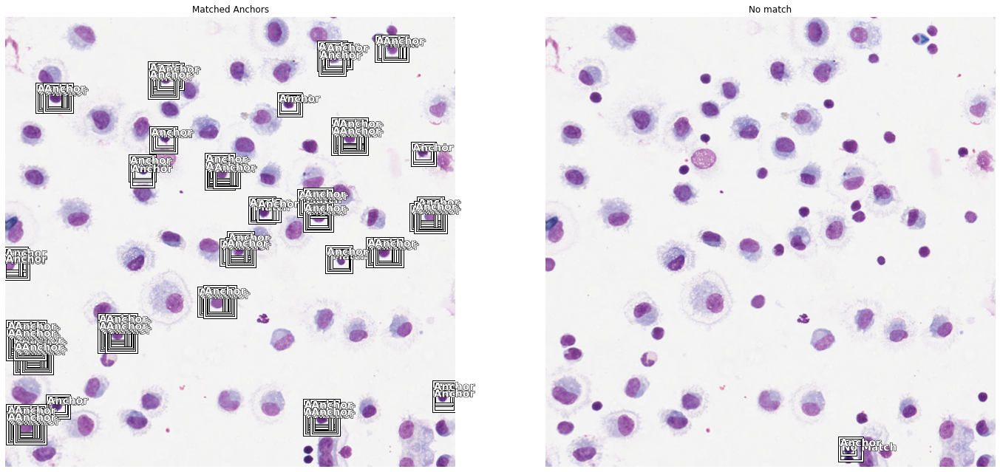

...

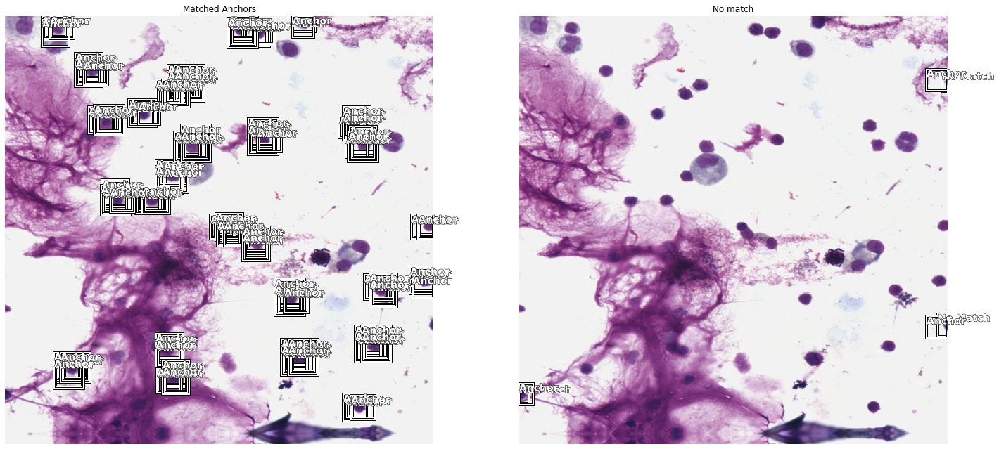

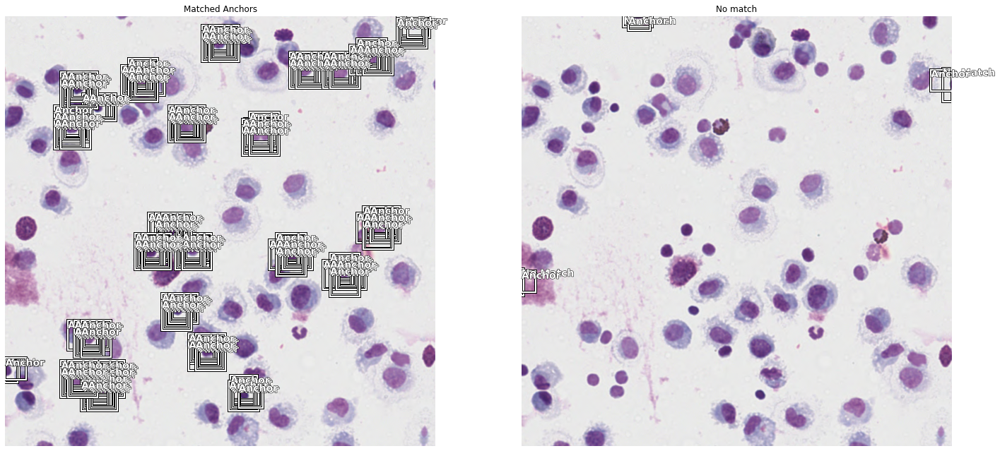

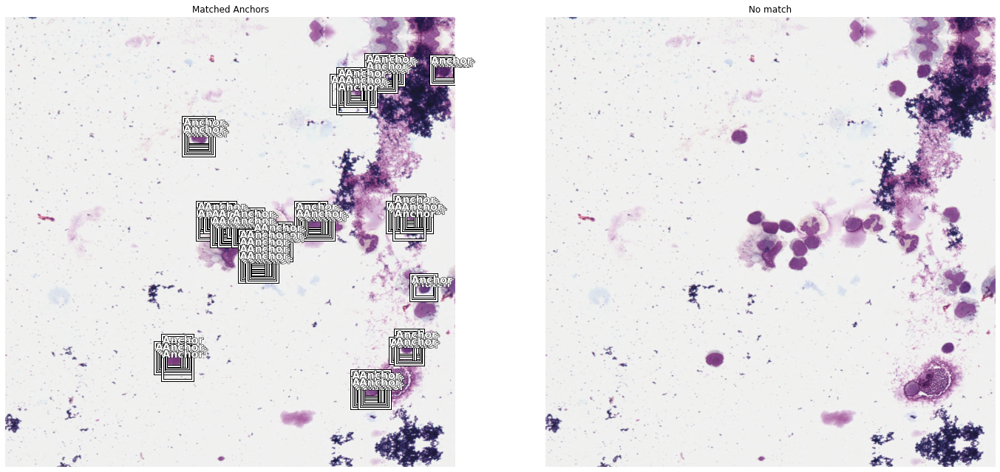

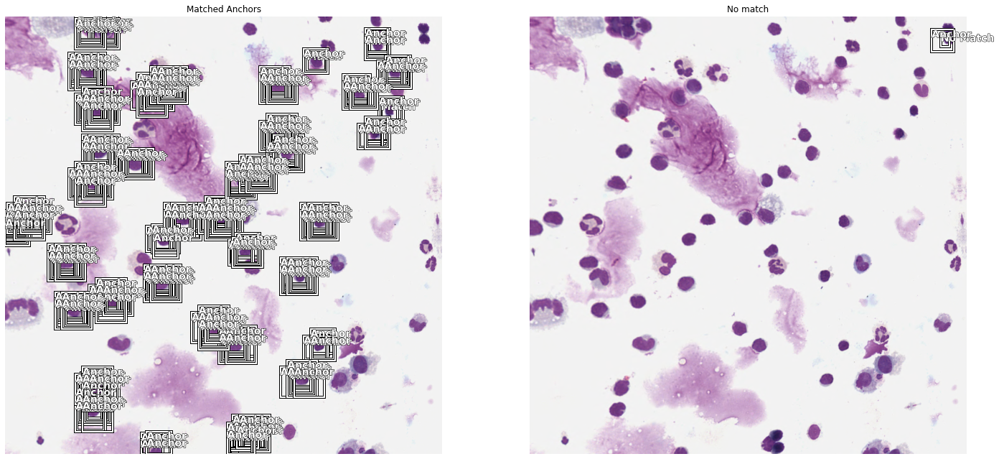

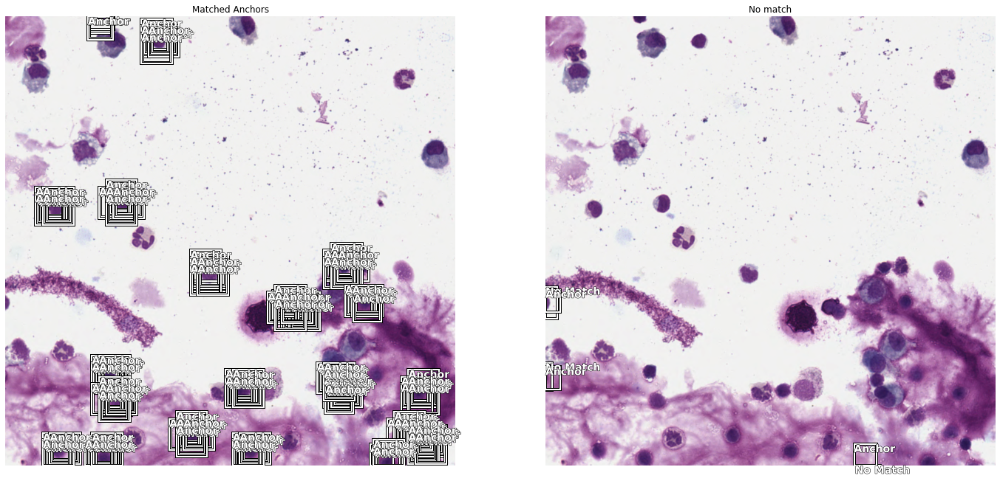

In [21]:
all_boxes, all_labels = show_anchors_on_images(data, anchors, figsize=(24, 24))

In [22]:
crit = RetinaNetFocalLoss(anchors)

encoder = create_body(models.resnet18, True, -2)
model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=len(scales), sizes=[64], chs=128, final_bias=-4., n_conv=2)

In [23]:
voc = PascalVOCMetricByDistance(anchors, size, [str(i) for i in data.train_ds.y.classes[1:]], radius=40)
learn = Learner(data, model, loss_func=crit, callback_fns=[BBMetrics], #BBMetrics, ShowGraph
                metrics=[voc])

In [24]:
learn.split([model.encoder[6], model.c5top5])
learn.freeze_to(-2)

In [25]:
learn.fit_one_cycle(3, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-Lymohozyten,time
0,0.962418,0.629535,0.354456,0.202838,0.426697,0.354456,09:19
1,0.484991,0.450513,0.455989,0.127688,0.322825,0.455989,10:58
2,0.323449,0.719397,0.507220,0.156181,0.563216,0.507220,12:30


In [26]:
learn.unfreeze()
learn.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-Lymohozyten,time
0,0.205635,0.500700,0.482931,0.141397,0.359303,0.482931,11:51
1,0.236677,0.545353,0.465641,0.237199,0.308154,0.465641,11:24
2,0.221447,0.803508,0.512867,0.175480,0.628029,0.512867,13:58
3,0.230815,0.483643,0.507115,0.180260,0.303383,0.507115,11:16
4,0.197081,0.413246,0.462124,0.114363,0.298883,0.462124,13:28
5,0.177905,0.611821,0.517573,0.123844,0.487977,0.517573,13:49
6,0.167215,0.589239,0.516415,0.119668,0.469570,0.516415,13:38
7,0.154488,0.531986,0.512941,0.102111,0.429875,0.512941,11:06
8,0.147913,0.458036,0.530714,0.110084,0.347953,0.530714,11:32
9,0.140628,0.527514,0.547180,0.108357,0.419157,0.547180,11:27


In [27]:
learn.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-Lymohozyten,time
0,0.136054,0.490076,0.524666,0.098727,0.391348,0.524666,11:04
1,0.156332,0.531187,0.511338,0.152956,0.378231,0.511338,10:57
2,0.182918,2.406765,0.530450,0.333356,2.073409,0.530450,15:32
3,0.200899,0.582293,0.412977,0.134903,0.447390,0.412977,10:15
4,0.184077,0.586800,0.510691,0.159336,0.427464,0.510691,13:21
5,0.174656,0.682454,0.511536,0.169909,0.512545,0.511536,12:29
6,0.164924,0.435646,0.486356,0.094537,0.341109,0.486356,12:32
7,0.155746,0.598939,0.527705,0.146953,0.451985,0.527705,13:36
8,0.142475,0.392822,0.498695,0.093885,0.298938,0.498695,11:59
9,0.138879,0.485331,0.499502,0.094220,0.391111,0.499502,13:42


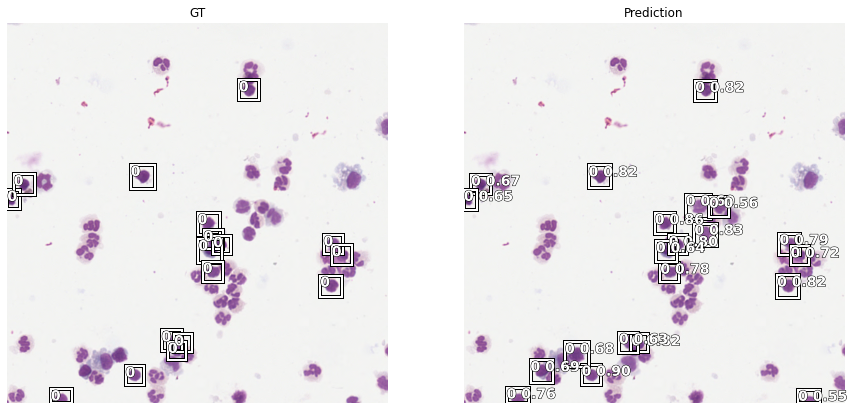

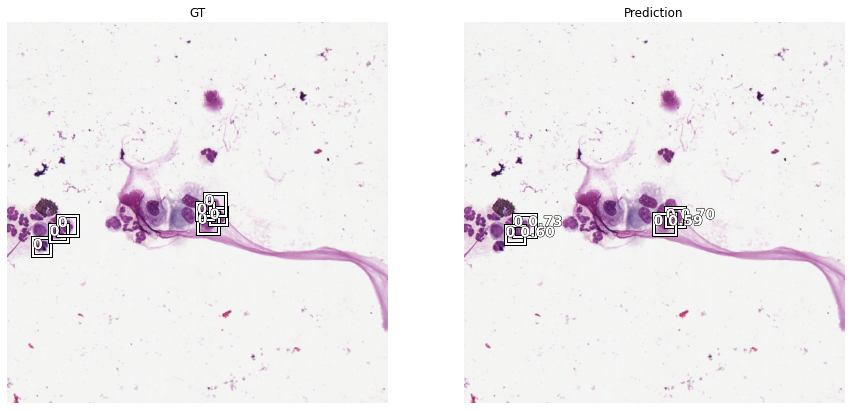

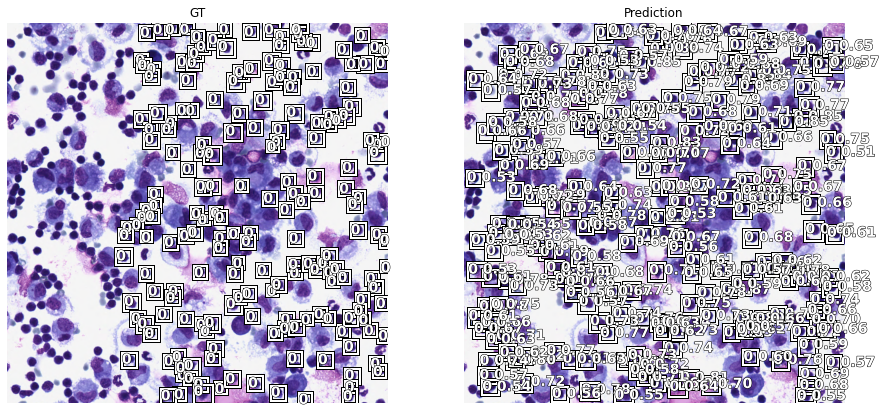

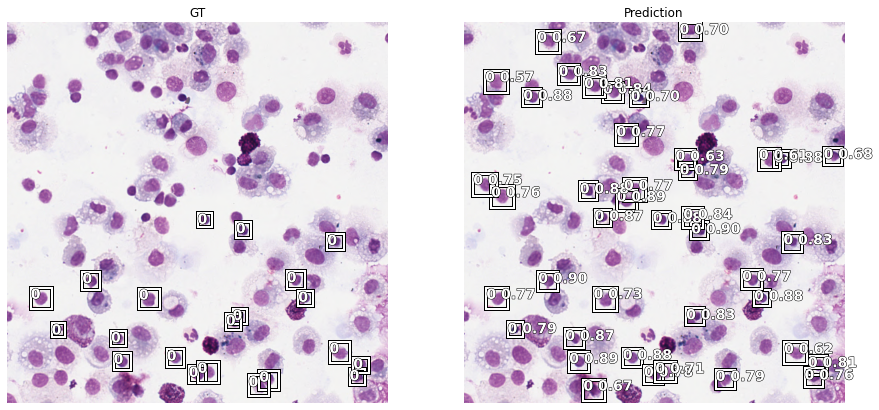

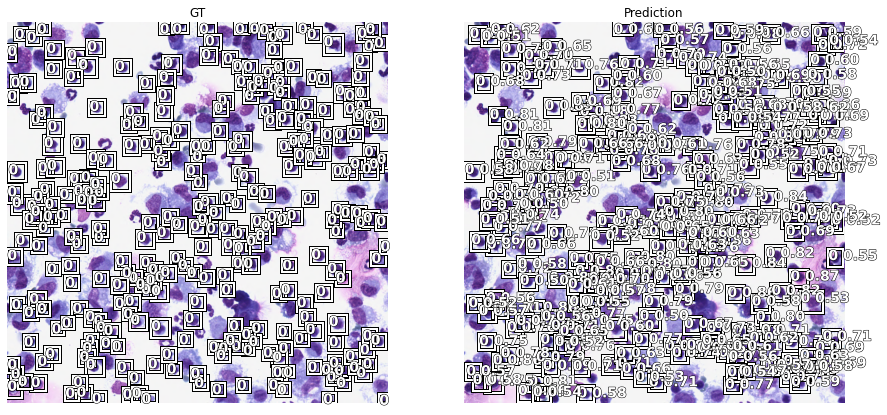

In [28]:
slide_object_result(learn, anchors, detect_thresh=0.5, nms_thresh=0.2)